# Data Science Skills Scraper - Part 2
## Performing the Analysis
---
### Authored: Theunis Raubenheimer
### Date: June 2021
---
### Problem Background:
A common problem faced by data scientists, data engineers and data analysts, especially novices, are not being certain of which skills to learn to ace that interview, or to perform at your current DS, DE or DA job. 

I found dozens of articles and videos online, but the problem was I found it difficult to trust the advice coming from this content, as it might be filled with their personal bias, or just their personal opinion which might not reflect the true state of the skills needed in industry at the moment.

I also figured that bootcamps, university courses and MOOCs (Massive Open Online Courses) are business and they want to sell you a course, so they might also just be using the data science hype and buzzwords to sell you these courses.

After experiencing the same feeling and wanting to upskill myself with skills that are actually needed, I wanted to find a way to identify the skills that I need to learn to stay relevant that will eliminate bias and that will accurately identify these skills.

---
### Approach:
Focusing on an industry 'pull' methodology vs a bootcamp/university/MOOC 'push' methodology, a BeautifulSoup web-scraper was built that scrapes the jobs site Indeed for full-time, entry-level 'data scientist' job postings in the US. These job postings are then stored in a CSV file, and analysed with Python and the nltk and pandas packages.

#### Considerations and Assumptions to be aware of:
1. An assumption is made that the job postings and the subsequent skills listed in them accurately reflects what skills are needed by the specified job listed. A common occurence is where people that don't possess the necessary technical knowledge to create the job postings, create them. This needs to be considered. 
2. Duplicate words in each job description was removed. A total of 495 jobs were scraped, so any one word can not be counted more than 495 times in total. The logic is explained below.
3. The code in part 1 and part 2 was repeated for 'Data Engineer' and 'Data Analyst' job roles, in addition to the 'Data Scientist' job role illustrated in part 1 and part 2. It is not shown in this analysis, as it follows the exact same procedure stipulated in parts 1 and 2. 
---

## Results:
The following is a report created, based on the analysis in the code in this notebook.

It was created in Power BI, and is a static version of an interactive dashboard.

### Data Scientist Analysis Results:
<div>
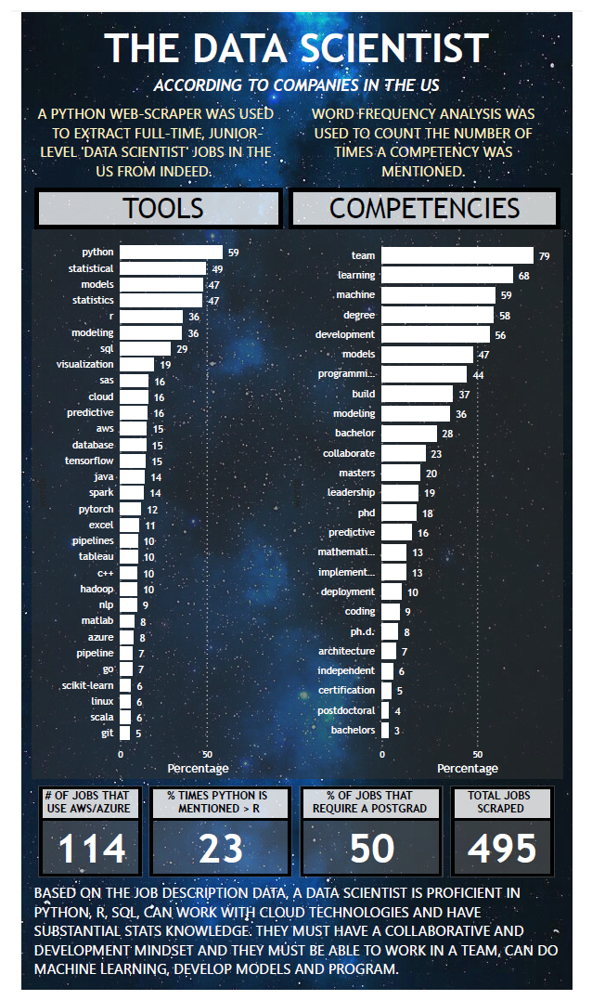
</div>

A few key insights:
- Python is king! It was mentioned 23% more times than R (59% vs 36%)
- Machine learning stays one of the top competencies needed for data scientists
- Data Scientists are educated: about 50% of job postings require a postgraduate degree

---

## The following reports are for the 'data engineer' and 'data analyst' roles:

### Data Engineer Analysis Results:
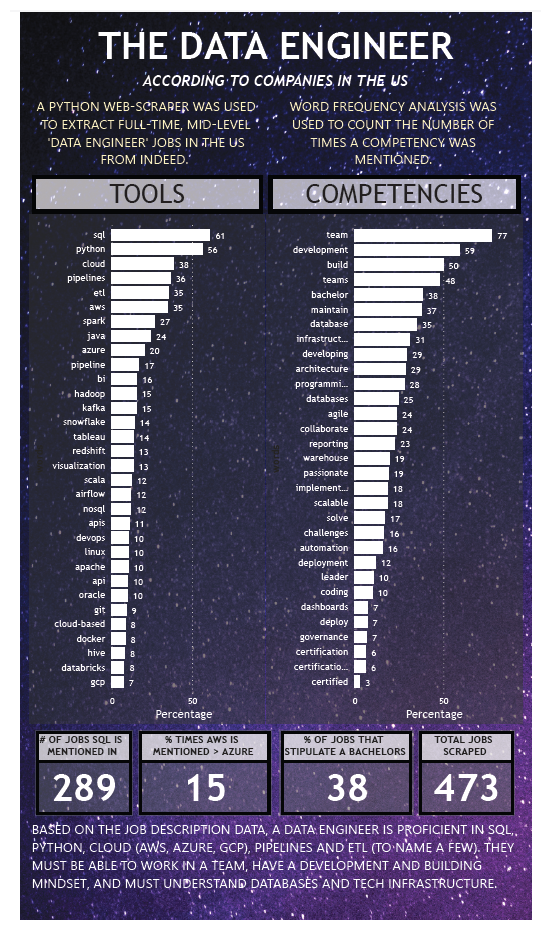

### Data Analyst Analysis Results:
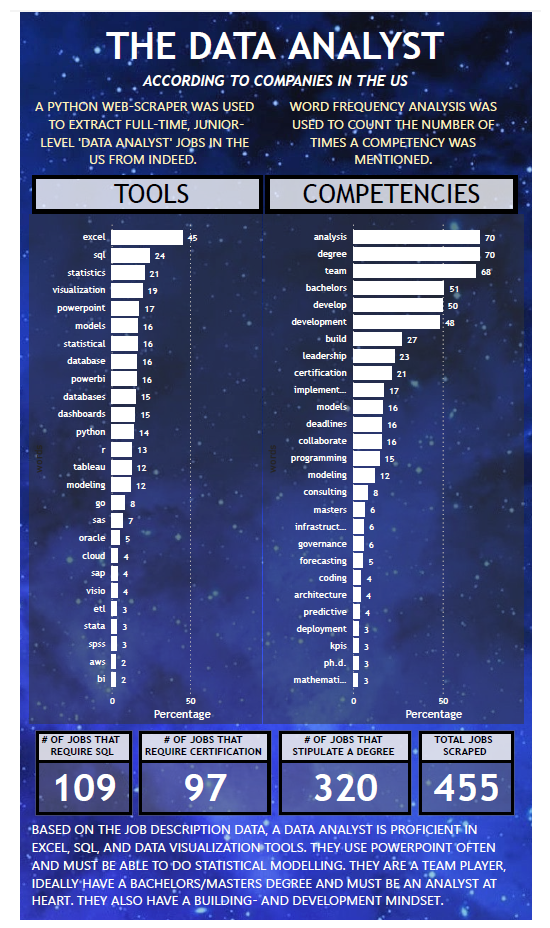

---

## Conclusion:
### A very fun exercise, this project showcased the collection of data, the cleaning of data, the interpeting and analysis of data, and finally, the visualization of the results of the interpretation and analysis. 

### It showcased how to use a webscraper to extract data from a website, and how to use a logical approach to formulating a business problem (_which skills should a data scientist learn_) and finally solving the problem using a data-driven approach. 

### To solve the business problem: in order to be deemed a competent data scientist, based on 495 real companies' data scientists requirements, the skills one should focus on is python, statistics, statistical modelling, R, SQL, data visualization and cloud technologies, to name a few. The competencies one should focus on is being able to work in a team, machine learning and be in possession of a degree (ideally a postgraduate degree). 

### A noteworthy insight achieved from the analysis of the 'data scientist', 'data engineer' and 'data analyst' job postings, was that the word 'team' was in the top 3 of competencies mentioned in all three roles for the job +-1200 job postings for the three roles. 

### _Working with data is a team sport, let us never forget that._  
---

## Start with Analysis:

### Imports

In [1]:
import pandas as pd                                                                     
import nltk                                                                                       #package to work with NLP operations
from nltk.corpus import stopwords                                                                 #stopwords that is built into nltk package corpus
import matplotlib.pyplot as plt                                                                   #for visualizing the data
from nltk.tokenize import word_tokenize                                                           #to be able to tokenize each word in the descriptions
nltk.download('punkt')
nltk.download('stopwords')
import collections                                                                                #tp be able to count the words
#import itertools                                                                                 #itertools needs to be imported in the same cell as which it is used

[nltk_data] Error loading punkt: <urlopen error [WinError 10054] An
[nltk_data]     existing connection was forcibly closed by the remote
[nltk_data]     host>
[nltk_data] Error loading stopwords: <urlopen error [WinError 10054]
[nltk_data]     An existing connection was forcibly closed by the
[nltk_data]     remote host>


### Read the xlsx file that was extracted with the web-scraper into a dataframe

In [2]:
df = pd.read_excel('Data_Science_Jobs_Indeed.xlsx')                                               #note: the csv file was converted to a xlsx file

### Inspect the dataframe to test successful loading

In [3]:
df.head()

,Description
0,Juristat is building an innovative suite of pr...
1,Job OverviewHathway is looking for an experien...
2,SUMMARY: The Data Scientist is part of BankUni...
3,Who we are\nDrizly is the worldâ€™s largest al...
4,"Ondot, now part of Fiserv, has helped over 4,5..."


### Display the amount of job descriptions that were scraped. 
#### Note: with 15 entries per page, this represents the first 33 pages!

In [1]:
len(df)

NameError: name 'df' is not defined

### Store the job descriptions in a dataframe called descriptions

In [5]:
descriptions = df['Description']

### Change the descriptions dataframe to a list, that stores all the descriptions in one single list so you can iterate through all of the words

In [6]:
all_descriptions = descriptions.values.tolist()

### Check to see whether all values are stored in a list:

In [7]:
all_descriptions

["Juristat is building an innovative suite of products, and we need the team to create those tools. Weâ€™re seeking a highly motivated and organized individual to join our data team as a Data Analyst. This team is responsible for acquiring and analyzing the most complete and accurate data available to grow our products and inform our business strategies.\nThis particular team member will be responsible for analyzing incoming legal documents in real-time to detect and correct errors in our processing, enter data from the source documents into templates, annotate legal documents, and provide feedback to others, to improve our proprietary artificial intelligence.\nRemote work-from-home options are available for this role. If you possess high attention to detail and a strong work ethic â€“ this is the job for you!\nABOUT THE POSITION\nYour responsibilities will include:\nCollecting and analyzing digital documents and related data\nReviewing data and documents for errors\nEntering, correcti

### Lower case the descriptions, as the stopwords package is all lowercase and to work with a standard

In [8]:
for i in range(len(all_descriptions)):
    all_descriptions[i] = all_descriptions[i].lower()

In [9]:
all_descriptions

["juristat is building an innovative suite of products, and we need the team to create those tools. weâ€™re seeking a highly motivated and organized individual to join our data team as a data analyst. this team is responsible for acquiring and analyzing the most complete and accurate data available to grow our products and inform our business strategies.\nthis particular team member will be responsible for analyzing incoming legal documents in real-time to detect and correct errors in our processing, enter data from the source documents into templates, annotate legal documents, and provide feedback to others, to improve our proprietary artificial intelligence.\nremote work-from-home options are available for this role. if you possess high attention to detail and a strong work ethic â€“ this is the job for you!\nabout the position\nyour responsibilities will include:\ncollecting and analyzing digital documents and related data\nreviewing data and documents for errors\nentering, correcti

### Tokenize, i.e. split the sentence into single words

In [10]:
for i in range(len(all_descriptions)):
    all_descriptions[i] = word_tokenize(all_descriptions[i])

### Count the number of words in all job descriptions, before duplicate words are removed

In [ ]:
num_words = 0
for i in range(len(all_descriptions)):
    num_words = num_words + len(all_descriptions[i])

print('The number of words in all job descriptions are:', num_words)

### Inspect to see if the words have been tokenized

In [11]:
print(all_descriptions)

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



### Remove duplicate words in each job description string
#### The reason is that some job descriptions can use a word over and over and therefore over emphasize the word, e.g. "Data Engineer / SQL-Developer: you will work in the SQL team with other SQL developers, developing SQL scripts to run on a MS SQL database. - The word 'SQL' is used 5 times, though it only carries two disctinct meaning (SQL and SQL-database). Therefore remove duplicates and work on the basis that a word, for 495 job descriptions, can not be mentioned more than 495 times. 

In [12]:
#therefore normalize the values by removing duplicates in EACH string.
all_descriptions_norm = list(range(len((all_descriptions))))
for i in range(len(all_descriptions)):
    all_descriptions_norm[i] = list(dict.fromkeys(all_descriptions[i]))

In [13]:
#check to see the length of the original with duplicates
for i in range(len(all_descriptions)):
    print(len(all_descriptions[i]))

410
561
296
928
531
632
382
2357
625
369
598
426
369
695
843
969
843
695
1067
493
632
955
728
426
561
672
561
248
708
816
770
3349
615
867
296
308
243
786
464
515
580
444
633
2357
802
419
647
816
450
383
505
515
1067
728
770
243
866
1136
742
994
243
866
1136
742
994
832
620
530
1101
732
212
965
1102
336
672
382
866
896
697
695
1102
977
529
749
479
564
571
640
713
307
507
988
944
308
698
950
719
728
1092
802
521
727
704
571
615
759
1092
999
602
679
227
494
523
323
907
518
1012
1037
742
704
81
840
617
564
709
518
421
752
164
156
561
745
391
294
330
307
991
840
638
978
582
479
567
633
1110
716
723
921
732
796
2656
725
316
966
514
965
387
813
200
3183
399
352
1151
1359
718
447
529
684
793
450
513
755
447
677
588
571
542
1151
707
497
374
2246
301
917
533
729
558
1052
347
3163
414
790
553
307
966
623
439
282
723
574
384
1591
281
638
448
709
675
450
573
276
430
225
786
790
626
723
543
275
390
3078
660
719
398
413
552
495
363
864
239
793
634
481
418
190
638
356
379
440
1591
162
400
642
323
269

In [14]:
#now check to see the length of the job description lists with duplicates removed:
for i in range(len(all_descriptions_norm)):
    print(len(all_descriptions_norm[i]))

205
297
173
428
255
300
224
651
314
204
308
236
194
367
387
444
387
329
485
259
300
437
366
236
297
355
289
156
364
378
367
894
313
381
173
195
135
342
231
287
303
221
328
651
390
205
328
378
266
215
255
287
485
366
367
135
431
525
362
430
135
431
525
362
430
404
292
287
481
359
132
402
503
176
355
224
431
417
330
367
503
389
258
376
257
307
289
334
344
176
278
453
458
195
368
477
358
363
443
390
268
311
374
289
302
373
443
439
303
327
142
266
271
191
423
280
380
416
366
374
60
428
273
307
352
280
235
349
114
106
288
386
212
154
203
174
463
416
310
480
297
238
308
329
486
305
339
414
359
391
674
353
162
473
252
402
224
395
121
863
228
198
480
603
383
222
266
328
383
205
256
367
222
336
306
314
277
480
366
255
211
697
173
379
274
364
286
433
177
826
181
384
329
174
422
326
228
157
319
317
208
502
174
310
219
342
342
226
287
182
224
142
406
355
308
319
293
167
193
850
368
358
223
232
296
284
190
399
154
383
315
251
220
110
310
186
200
244
502
102
191
297
185
157
194
178
269
275
449
470
4

### Count the new number of words in all descriptions, after duplicates were removed

In [15]:
num_words = 0
for i in range(len(all_descriptions_norm)):
    num_words = num_words + len(all_descriptions_norm[i])

print('The number of words in all job descriptions are:', num_words)

The number of words in all job descriptions are: 159171


### Remove stop words:

In [16]:
#store the english stopwords in a variable called all_stopwords
all_stopwords = stopwords.words('english')
#If you want to remove the word 'go' from the stopwords list:
#all_stopwords.remove('go')
#if you want to add stopwords (the lines adds the words in brackets):
sw_list = ['when','technology','join','leading','benefits','compensation']
all_stopwords.extend(sw_list)

### Inspect to see wht the stopwords list looks like

In [17]:
all_stopwords

['i',
 'me',
 'my',
 'myself',
 'we',
 'our',
 'ours',
 'ourselves',
 'you',
 "you're",
 "you've",
 "you'll",
 "you'd",
 'your',
 'yours',
 'yourself',
 'yourselves',
 'he',
 'him',
 'his',
 'himself',
 'she',
 "she's",
 'her',
 'hers',
 'herself',
 'it',
 "it's",
 'its',
 'itself',
 'they',
 'them',
 'their',
 'theirs',
 'themselves',
 'what',
 'which',
 'who',
 'whom',
 'this',
 'that',
 "that'll",
 'these',
 'those',
 'am',
 'is',
 'are',
 'was',
 'were',
 'be',
 'been',
 'being',
 'have',
 'has',
 'had',
 'having',
 'do',
 'does',
 'did',
 'doing',
 'a',
 'an',
 'the',
 'and',
 'but',
 'if',
 'or',
 'because',
 'as',
 'until',
 'while',
 'of',
 'at',
 'by',
 'for',
 'with',
 'about',
 'against',
 'between',
 'into',
 'through',
 'during',
 'before',
 'after',
 'above',
 'below',
 'to',
 'from',
 'up',
 'down',
 'in',
 'out',
 'on',
 'off',
 'over',
 'under',
 'again',
 'further',
 'then',
 'once',
 'here',
 'there',
 'when',
 'where',
 'why',
 'how',
 'all',
 'any',
 'both',
 'each

In [18]:
all_words_no_sw = list(range(len((all_descriptions_norm))))
for i in range(len(all_descriptions_norm)):
    all_words_no_sw[i] = [word for word in all_descriptions_norm[i] if not word in all_stopwords]
    
#If the code doesn't work, then run this code in the comments below and comment it out to re-use: 
#all_words_no_sw = [word for word in all_descriptions if not word in all_stopwords]
#all_words_no_sw = []

#for i in range(len(all_descriptions)):
#    if all_descriptions[i] not in all_stopwords:
#        all_words_no_sw.append(i)

### Check to see how many words were removed

In [19]:
num_words_no_sw = 0
for i in range(len(all_words_no_sw)):
    num_words_no_sw = num_words_no_sw + len(all_words_no_sw[i])

print('The number of words in all job descriptions are:', num_words_no_sw)

The number of words in all job descriptions are: 139010


### Quick inspection to see it stopwords were removed

In [20]:
all_words_no_sw

[['juristat',
  'building',
  'innovative',
  'suite',
  'products',
  ',',
  'need',
  'team',
  'create',
  'tools',
  '.',
  'weâ€™re',
  'seeking',
  'highly',
  'motivated',
  'organized',
  'individual',
  'data',
  'analyst',
  'responsible',
  'acquiring',
  'analyzing',
  'complete',
  'accurate',
  'available',
  'grow',
  'inform',
  'business',
  'strategies',
  'particular',
  'member',
  'incoming',
  'legal',
  'documents',
  'real-time',
  'detect',
  'correct',
  'errors',
  'processing',
  'enter',
  'source',
  'templates',
  'annotate',
  'provide',
  'feedback',
  'others',
  'improve',
  'proprietary',
  'artificial',
  'intelligence',
  'remote',
  'work-from-home',
  'options',
  'role',
  'possess',
  'high',
  'attention',
  'detail',
  'strong',
  'work',
  'ethic',
  'â€',
  '“',
  'job',
  '!',
  'position',
  'responsibilities',
  'include',
  ':',
  'collecting',
  'digital',
  'related',
  'reviewing',
  'entering',
  'correcting',
  'formatting',
  'wor

### Count the frequency of the words

In [21]:
#flatten the list, i.e. put it all in one list, using itertools:
import itertools #need to import itertools in the same cell as the list as it is in the same module where the list function lives
all_words_no_sw_one_list = list(itertools.chain(*all_words_no_sw))

In [22]:
#count the number of times a word is used
word_counts = collections.Counter(all_words_no_sw_one_list)

### List the top 15 most common words to see what other words need to be removed for successful analysis

In [23]:
word_counts.most_common(15)

[(',', 495),
 ('.', 492),
 ('data', 453),
 (':', 448),
 ('experience', 445),
 ('(', 439),
 (')', 439),
 ('work', 426),
 ('science', 394),
 ('team', 392),
 ('skills', 382),
 ('learning', 339),
 ('new', 308),
 ('including', 305),
 ('computer', 294)]

### Create a pandas dataframe to analyse and plot the values

In [24]:
word_counts = pd.DataFrame(word_counts.most_common(70), columns = ['words','counts'])
word_counts.head()

,words,counts
0,",",495
1,.,492
2,data,453
3,:,448
4,experience,445


### Visualize the words with matplotlib

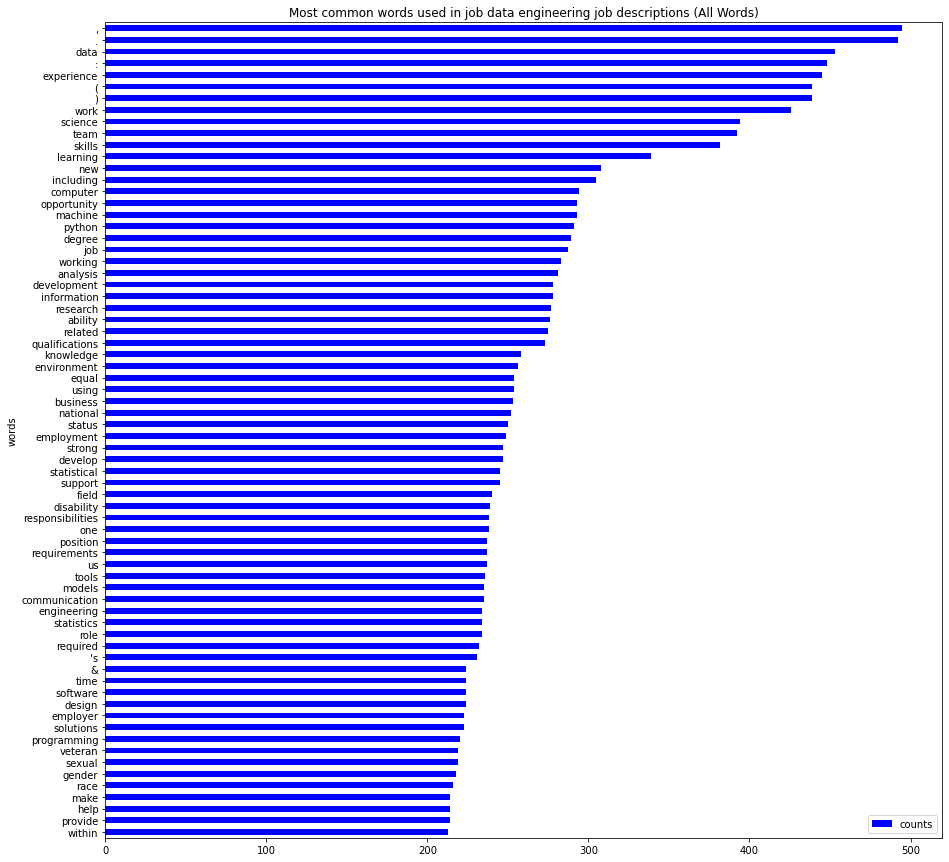

In [25]:
fig, ax = plt.subplots(figsize=(15, 15))
word_counts.sort_values(by='counts').plot.barh(x = 'words', y = 'counts', ax=ax, color = 'blue')
ax.set_title("Most common words used in job data engineering job descriptions (All Words)")
plt.show()

### Add the words that still need to be removed, identified after inspection of the above visualization

In [26]:
sw_list_added = [',','.','experience','(',')','work','skills','solutions','new','working','ability','knowledge','',';','status','job','management','&','including','requirements','company','required','years','using','environment','opportunity',' \'s ','services','technologies','strong','us','position','role','employment','related','provide','people','equal','qualifications','-','best','help','quality',':','data','business','systems','engineer','tools,','science','`s','building','platform','product','preferred','computer','disability','time','processes','one','across','employer','gender','may','world','performance','responsibilities','?','looking','health','employees','national','engineers','like','make','must','and/or','understanding','protected','within','veteran','needs','etc','use','create','ensure','applicants','practises','big','responsible','processing','race','part','organization','sexual','clients','orientation','field','!','well','origin','opportunities','problems','color','project','large','religion','service','identity','industry','network','multiple','learn','application','perform','age','deliver','without','improve','/','internal','sources','based','candidate','center','program','also','issues','need','$','understand','include','value','enterprise','career','æ','â€','practises','professional','diverse','employee','committed','high','able','life','variety','plus','critical','education','mission','operations','drive','advanced','healthcare','various','location','customer','practices','please','training','culture',' \" ','impact','research','sex','duties','group','digital','future','key','candidates','every','stakeholders','excellent','level','global','youâ€™re','apply','care','*','members','meet','delivery','regard','google','description','full-time','storage','highly','year','growth','users','companies','better','vision','documentation','equivalent','minimum','following','day','additional','1','diversity','providing','identify','sets','marketing','written','travel','paid','good','law','languages','standards','closely','#','creating','office','united','financial','local','tasks','familiarity','procedures','transformation',' \'re ','individual','access','relevant','focus','growing','full','state','receive','offer','around','background','operational','together','physical','includes','least','provides','successful','client','unique','experiences','environments','great','functions','cognizant','current','take','way','medical','%','core','seeking','capabilities','requires','enable','partner','â€œ','youÃ¢â‚¬â„¢ll','existing','remote','insurance','expertise','weÃ¢â‚¬â„¢re','federal','get','electrical','equipment','flexible','programs','marital','available','individuals','essential','writing','type','basis','member','needed','department','assist','change','transform','solving','microsoft','making','believe','partners','values','others','place','managing','plans','ways','consideration','accommodation','senior','web','policy','different','inclusive','passion','similar','success','effectively','want','scientists','analysts','bring','range','efficient','right','activities','per','planning','u.s.','external','open','problem','modern','general','e.g','dental','effective',"'ll","'re",'resources','assistance','participate','functional','results','businesses','operating','action','demonstrated','salary','areas','military','sales','personal','community','states','driven','source','control','delivering','works','monitoring','concepts','serve','grow','hours','real','expression','next','deep','integrity','reasonable','proven','workplace','applicable','3','expert','amazon','initiatives','2','language','verbal','collaborative','”','comprehensive','require','assigned','proud','contribute','sponsorship','standard','commitment','components','would','troubleshooting','staff','improvements','pay','complete','methodologies','focused','jobs','administration','set','k','define','limitied','helps','contact','user','lives','“','youâ€™ll','weâ€™re','limited','hardware','potential','know','write','exceptional','family','used','primary','proficiency','basic','market','inclusion','find','construction','top','end','solution','hiring','levels','many','government','eligible','makes','approach','love','specific','@','genetic','achieve','first','schedule','structures','helping','quickly','2021','media','built','efficiency','principles','performing','extensive','developers','dedicated','small','exciting','wide','appropriate','fast','home','query','package','consistent','citizenship','public','experienced','questions','things','documented','locations','throughout','possible','summary','order','review','strategy','clearance','talent','dynamic','stack','addition','optimize','keep','independently','e.g.','collaboration','optimizing','frameworks','documents','ancestry','queries','strategic','continuous','ideal','designs','goals','area','necessary','directly','offers','problem-solving','currently','5','applying','bonus','fully','inc.','efforts','daily','millions','optimal','move','improvement','detail','email','interested','safety','talented','managers','brands','characteristic','relationships','tech','types','resort','decision','batch','backgrounds','major','fast-paced','changing','hands','organizational','communities','york','positions','transforming',"'",'manager','conditions','motivated','automated','https','meaningful','features','groups','run','abilities','disabilities','content','reliable','discriminate','thrive','share','execute','3+','leverage','social','positive','strategies','document','developer','see','enjoy','space','professionals','common','come','challenging','goal','improving','methods','master','made','accenture','successfully','401','among','ecosystem','visit','visa','attention','eeo','record','experts','secure','architectures','identifying','two','interest','networks','desired','mitre','remotely','outside','thinking','leveraging','actionable','note','request','desire','important','track','ownership','direction','robust','mathematics','centers','domain','deploying','associated','acquisition','reliability','networking','resume','sense','check','manufacturing','data-driven','creation','date','search','monitor','ensuring','manner','site','``', "''", 'objectives','overview','subject','regardless','analytic','san','leave','structured','largest','follow','integrate','leaders','overall','human','latest','give','comfortable','direct','supports','considered','100','roles','strive','everyone','extraction','policies','willingness','class','enhance','become','someone','401k','taking','recommendations','interpersonal','mechanical','commercial','consumers','conduct','extract','integrations','excellence','recognized','cases','+','matter','emr','located','workflow','upon','organizations','performs','organizations','2+','prioritize','collection','university','assets','prepare','specifications','timely','outcomes','feedback','foundation','discrimination','materials','load','form','skill','compliance','capital','ingestion','hire','accurate','firm','operate','energy','along','perks','fortune','evaluate','submit','details','5+','owners','today','rapidly','facilities','operation','school','configuration','wellness','clear','fit','framework','ongoing','veterans','greater','online','flows','vendors','workforce','changes','account','accounts','perspective','perspectives','consider','empower','portfolio','patterns','metrics','another','interview','events','cross-functional','generation','yearsâ€™','exposure','long-term','attitude','solid','finance','difference','end-to-end','fun','trends','practical','smart','pregnancy','cycle','flexibility','look','accommodations','unitedhealth','eligibility','automate','points','running','validation','quantitative','investment','obtain','legally','hard','utilizing','+1','provided','algorithms','view','determine','think','balance','ready','present','city','communications','savings','mental','associate','free','availability','entire','lifecycle','via','priorities','preferably','laws','significant','1+','techniques','contract','maintaining','driving','recruiting','report','proficient','hour','packages','maintains','translate','metadata','reach',"'s",'support','tools','communication','engineering','design','technical','scientist','complex','qualified','developing','applications','competitive','analytical','innovative','solve','communicate','system','analyze','ai','scientific','applied','testing','analyses','manage','lead','creative','optimization','artificia','approaches','sciences','supporting','ideas','discipline','clinical','graduate','scale','expected','findings','analyzing','accuracy','applicant','40','prior','worldâ€™s','combination','guidance','leader','completion','influence','regular','towards','oral','creed','letter','possess','explore','advance','benefit','analyst','setting','demonstrate','personnel','designing','tests','checks','methodology','retirement','researchers','consumer','scripting','devices','trust','selected','contingent','automation','biology','valuable','discover','state-of-the-art','promotion','produce','broad','rewarding','requirement','regarding','posting','presentation','colleagues','amounts','experimental','worldwide','audiences','emerging','involved','patient','selection','interpret','appointment','religious','interact','criminal','presentations','weekly','intelligent','utilize','priority','non-technical','biostatistics','affirmative','patients','division','evaluation','collect','beyond','publications','evaluating','creativity']
all_stopwords.extend(sw_list_added)

### Note: A dataset with the most commonly used English words were downloaded
### Read in this most used words excel file into a dataframe

In [27]:
most_used_words = pd.read_excel('most_used_words.xlsx')

### Convert most_used_words dataframe to list

In [28]:
most_used_words_list = most_used_words['words'].values.tolist() #need to only transform the column, if you take the whole dataframe then it returns each value in its own square brackets, which in turn doesn't let you append it to the stopwords list

### Add the most_used_words to the all_stopwords list:

In [29]:
all_stopwords.extend(most_used_words_list)

### Check to see if the new stopwords were added

In [30]:
all_stopwords

### Remove the new stopwords:

In [31]:
for i in range(len(all_descriptions_norm)):
    all_words_no_sw[i] = [word for word in all_descriptions_norm[i] if not word in all_stopwords]

### Check to see how many words have been removed:

In [32]:
num_words_no_sw = 0
for i in range(len(all_words_no_sw)):
    num_words_no_sw = num_words_no_sw + len(all_words_no_sw[i])

print('The number of words in all job descriptions are:', num_words_no_sw)

The number of words in all job descriptions are: 55383


### Flatten the list, i.e. put it all in one list, using itertools:

In [33]:
import itertools #need to import itertools in the same cell as the list as it is in the same module where the list function lives
all_words_no_sw_one_list = list(itertools.chain(*all_words_no_sw))

### Count the number of times a word is used

In [34]:
word_counts = collections.Counter(all_words_no_sw_one_list)

### Inspect the wordcounts to see what words need to be removed

In [35]:
word_counts.most_common(15)

### Create a pandas dataframe to analyse and plot the values:

In [36]:
word_counts = pd.DataFrame(word_counts.most_common(1000), columns = ['words','counts'])

### Visualize the words:

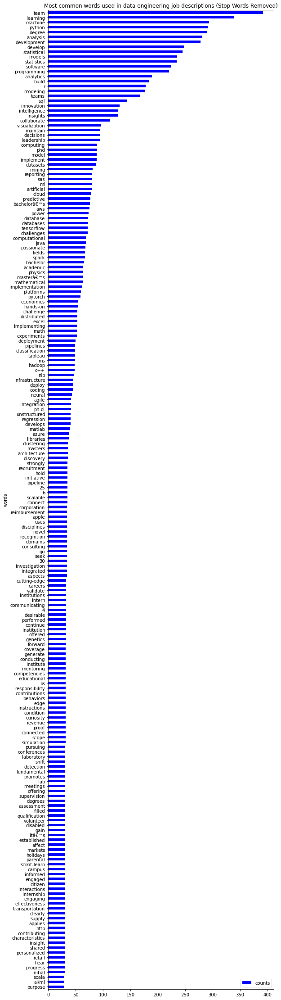

In [37]:
word_counts_top_200 = word_counts.head(200)
fig, ax = plt.subplots(figsize=(9, 40))
word_counts_top_200.sort_values(by='counts').plot.barh(x = 'words', y = 'counts', ax=ax, color = 'blue')
ax.set_title("Most common words used in data engineering job descriptions (Stop Words Removed)")
plt.show()

---
## Helpful calculations that aided above analysis, and also helped in the development of the Power BI dashboard
---

### Use the excel sheet to identify the index of the word being searched for, so you can copy the output (the words that need to be removed from our dataset) into your stopwords list

In [ ]:
word_counts.loc[100].at["words"]                                  #locate the word at index 100

### In order to see the exact count of a specific word, do the following:

In [ ]:
word_counts.loc[word_counts['words']=='aws']                      #'words' refers to the column name and 'aws' refers to the word being searched for.

In [41]:
word_counts.loc[word_counts['words']=='azure']                    #same as above, just for the word 'azure'

,words,counts
86,azure,38


### Export the words to csv so you can identify (the words that aren't critical to analyses), copy and paste them into the list of stopwords that need to be removed

In [42]:
word_counts.to_csv('Words_Used.csv', index = False)

### Convert the stopwords list to a dataframe so you can export it to excel for future use:

In [ ]:
stop_words_df = pd.DataFrame(all_stopwords,columns=['Stop_Words'])

### Export it as an excel sheet:

In [ ]:
stop_words_df.to_csv('Stop_Words_Used.csv', index =False)